현재 사용 중인 디바이스: cuda
데이터셋 클래스: ['brain_glioma', 'brain_menin', 'brain_tumor']
'/root/workspace/best_model.pt' 파일에서 모델 state_dict를 불러왔습니다.

--- 총 20개의 이미지에 대한 분석을 시작합니다 ---

--- [이미지 인덱스: 5144] 분석 중 ---
실제 클래스: brain_tumor | 모델 예측: brain_tumor


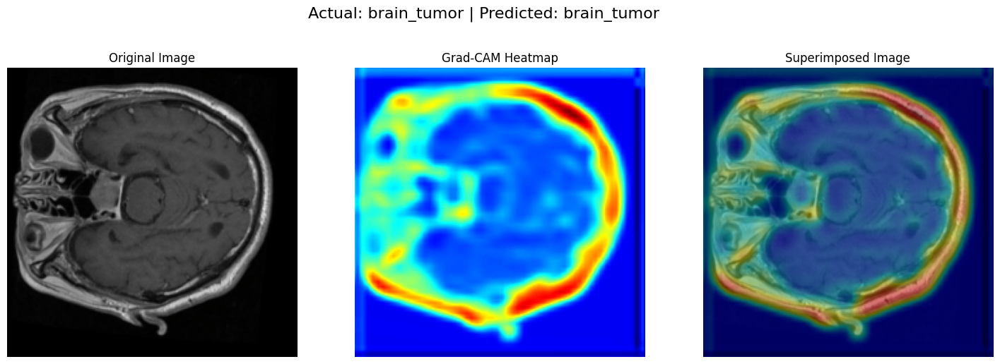


--- [이미지 인덱스: 597] 분석 중 ---
실제 클래스: brain_glioma | 모델 예측: brain_glioma


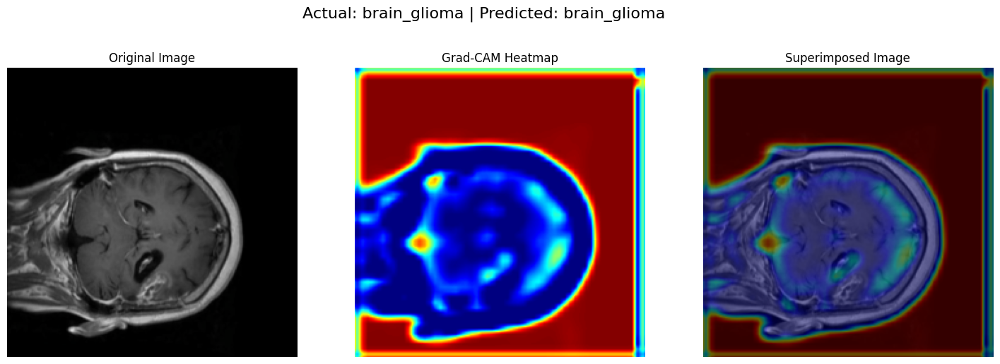


--- [이미지 인덱스: 1461] 분석 중 ---
실제 클래스: brain_glioma | 모델 예측: brain_glioma


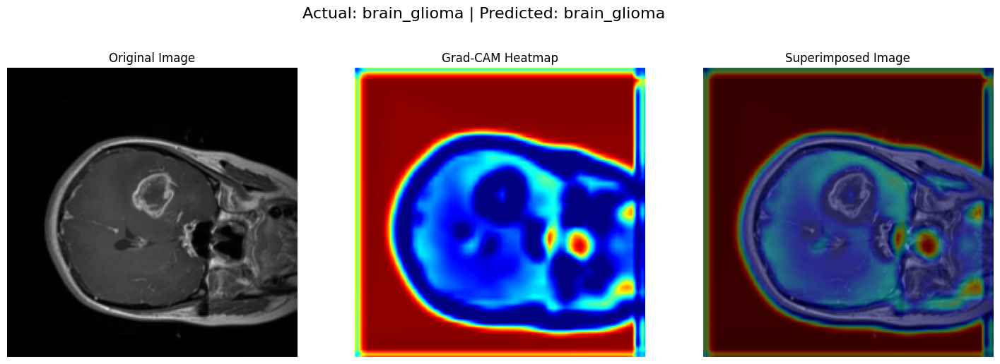


--- [이미지 인덱스: 114] 분석 중 ---
실제 클래스: brain_glioma | 모델 예측: brain_glioma


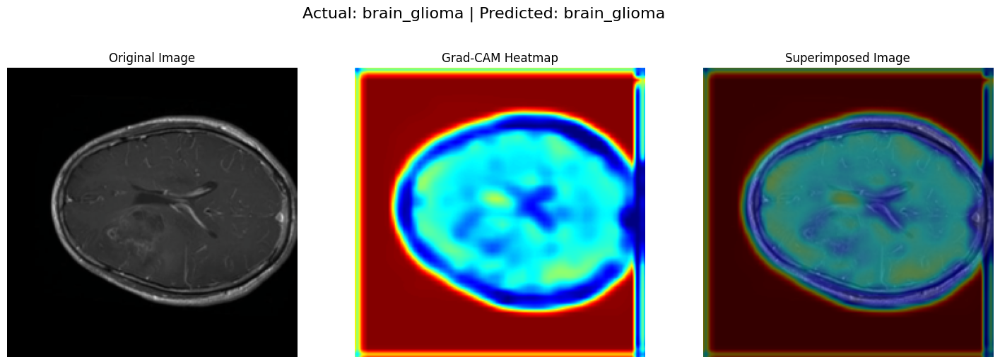


--- [이미지 인덱스: 237] 분석 중 ---
실제 클래스: brain_glioma | 모델 예측: brain_glioma


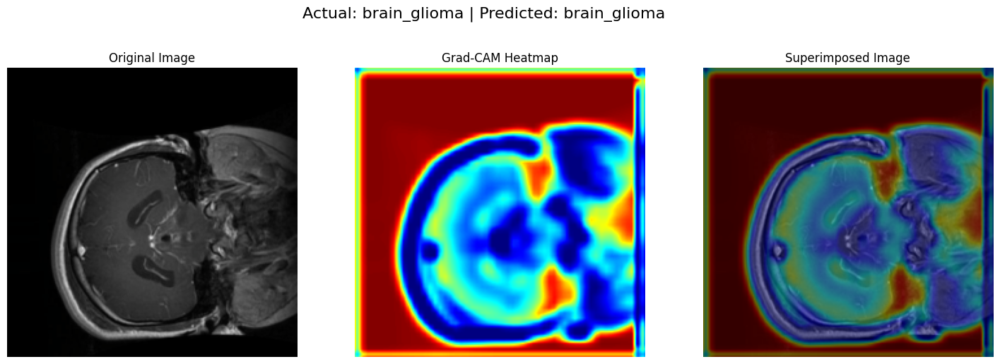


--- [이미지 인덱스: 4876] 분석 중 ---
실제 클래스: brain_tumor | 모델 예측: brain_tumor


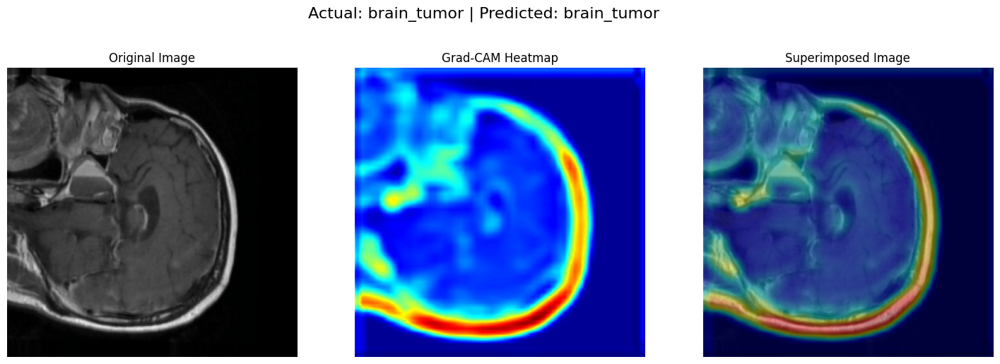


--- [이미지 인덱스: 2345] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


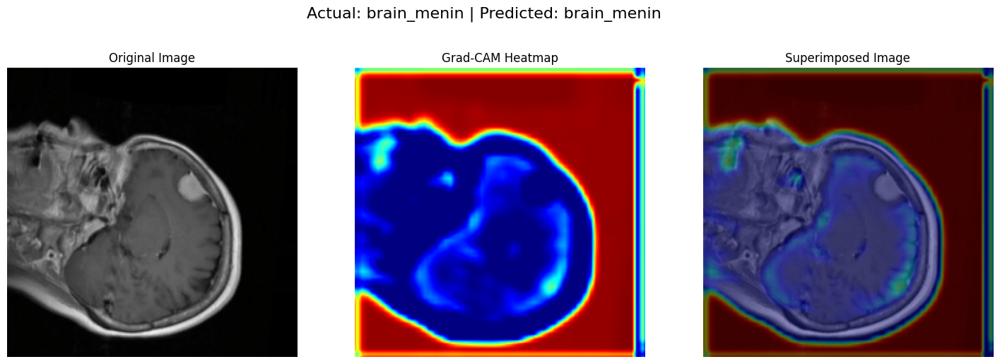


--- [이미지 인덱스: 3470] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


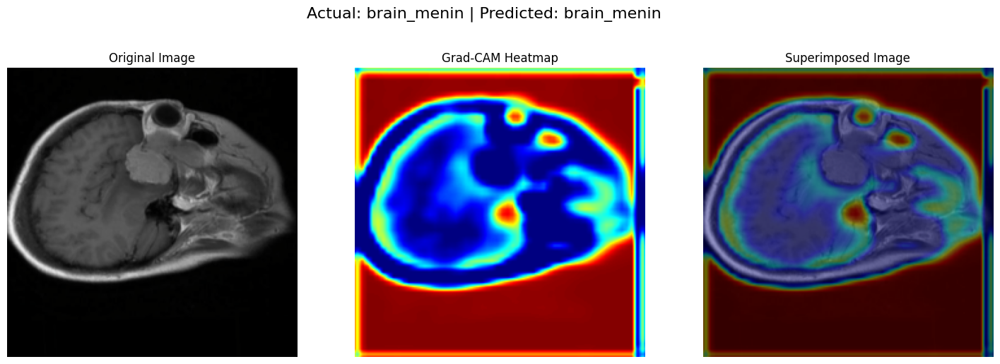


--- [이미지 인덱스: 5888] 분석 중 ---
실제 클래스: brain_tumor | 모델 예측: brain_tumor


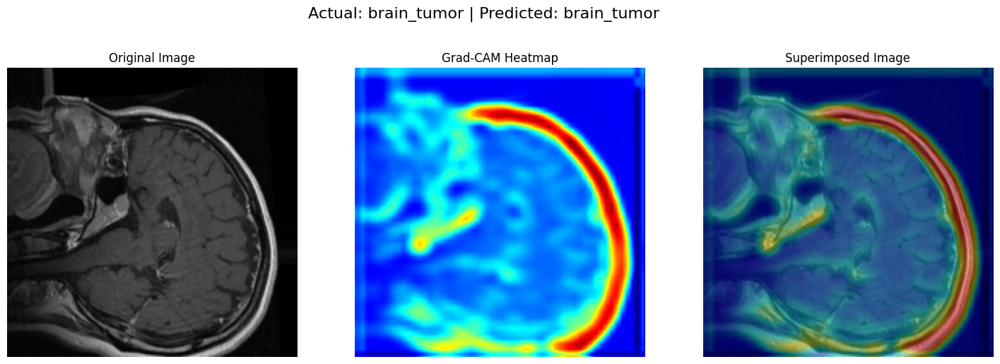


--- [이미지 인덱스: 23] 분석 중 ---
실제 클래스: brain_glioma | 모델 예측: brain_glioma


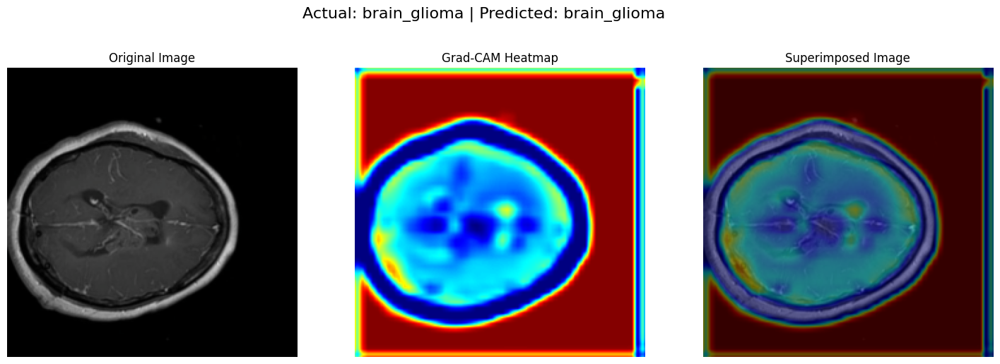


--- [이미지 인덱스: 3757] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


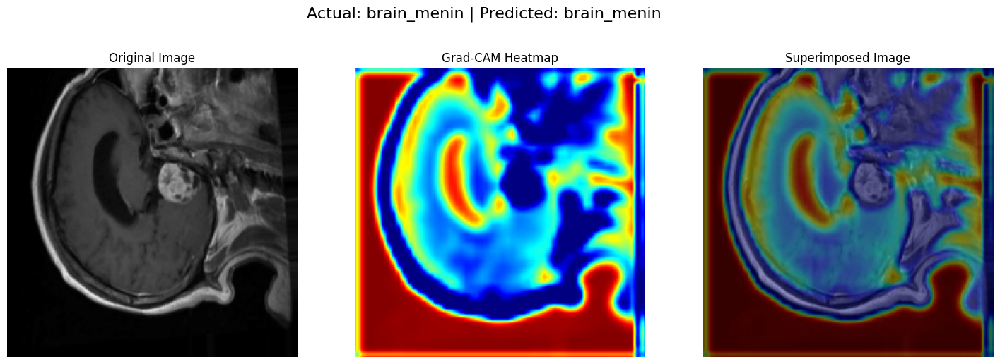


--- [이미지 인덱스: 3503] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


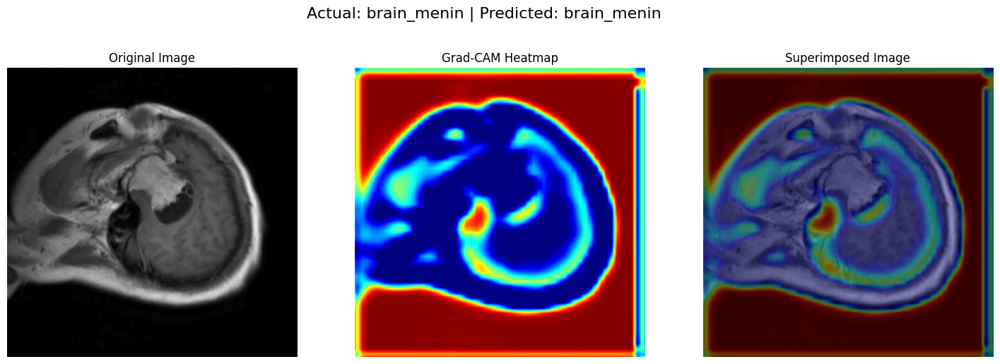


--- [이미지 인덱스: 2517] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


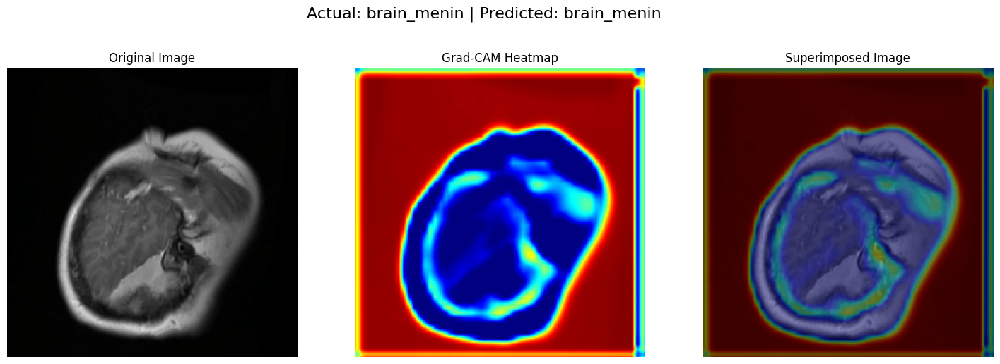


--- [이미지 인덱스: 1287] 분석 중 ---
실제 클래스: brain_glioma | 모델 예측: brain_glioma


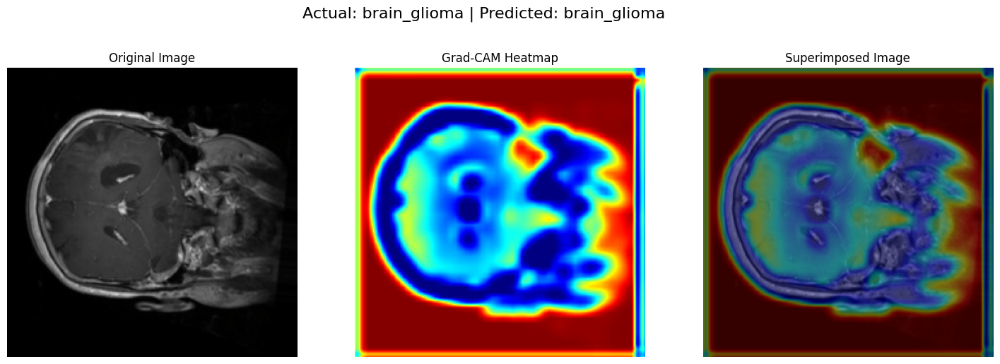


--- [이미지 인덱스: 5093] 분석 중 ---
실제 클래스: brain_tumor | 모델 예측: brain_tumor


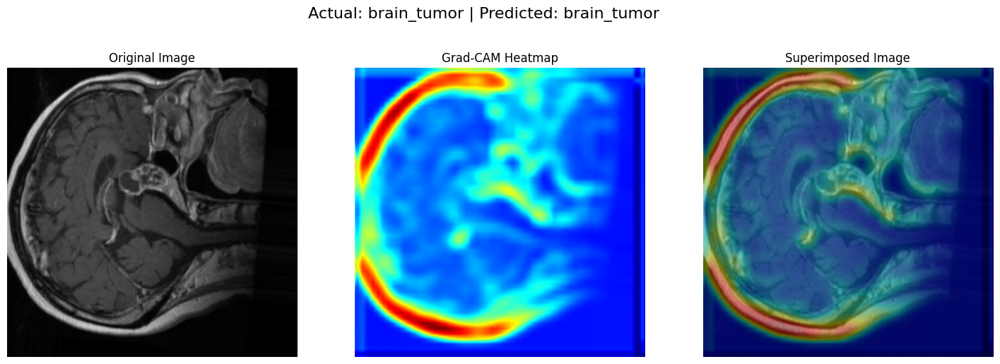


--- [이미지 인덱스: 3954] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


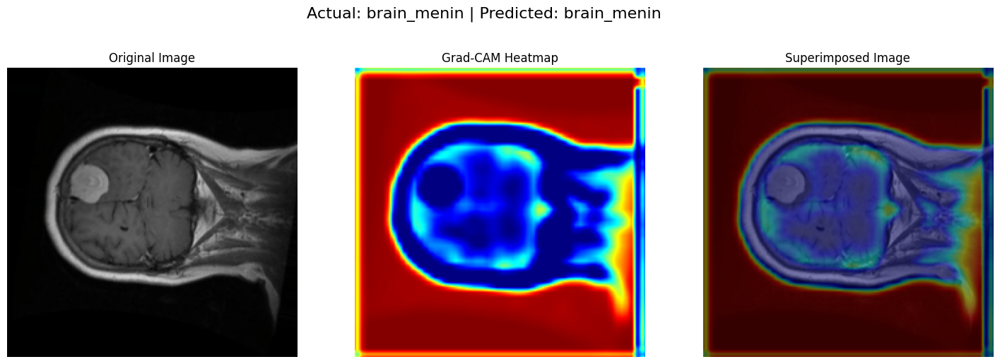


--- [이미지 인덱스: 2122] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


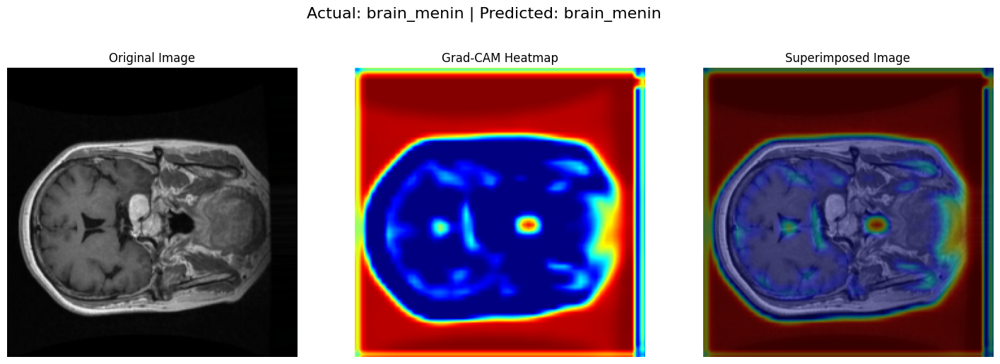


--- [이미지 인덱스: 3687] 분석 중 ---
실제 클래스: brain_menin | 모델 예측: brain_menin


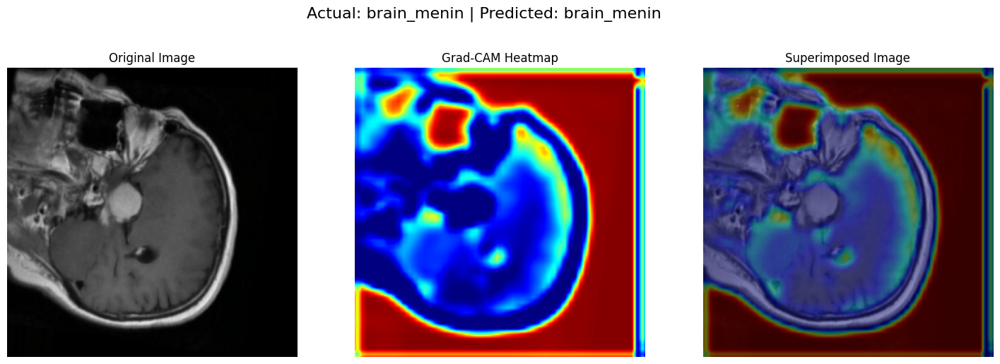


--- [이미지 인덱스: 5400] 분석 중 ---
실제 클래스: brain_tumor | 모델 예측: brain_tumor


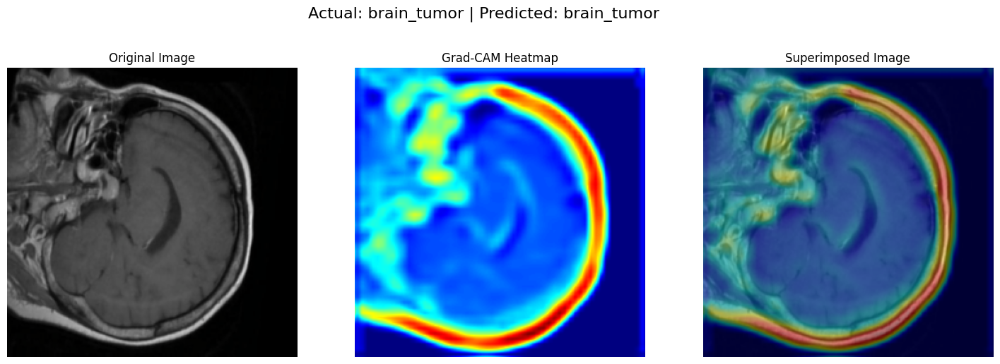


--- [이미지 인덱스: 5699] 분석 중 ---
실제 클래스: brain_tumor | 모델 예측: brain_tumor


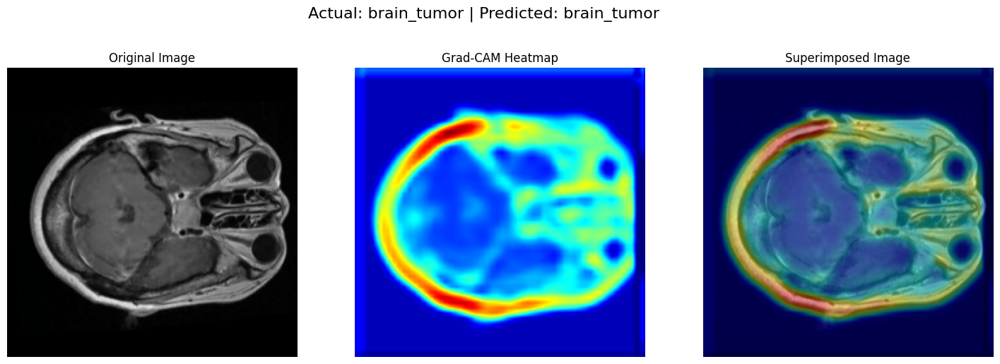

In [18]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from PIL import Image
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage.transform import resize

import random

# ===================================================================
# 1단계: 기본 설정 및 필요 클래스/함수 정의
# (모델을 불러오기 위해, 모델의 구조를 정의한 클래스들이 반드시 필요합니다)
# ===================================================================

# 기본 설정
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"현재 사용 중인 디바이스: {device}")

# 모델 클래스 정의 (이전 코드와 동일)
class ChannelAttention(nn.Module):
    def __init__(self, in_planes, ratio=16):
        super(ChannelAttention, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)
        self.fc = nn.Sequential(nn.Conv2d(in_planes, in_planes // ratio, 1, bias=False), nn.ReLU(), nn.Conv2d(in_planes // ratio, in_planes, 1, bias=False))
        self.sigmoid = nn.Sigmoid()
    def forward(self, x):
        avg_out = self.fc(self.avg_pool(x)); max_out = self.fc(self.max_pool(x))
        return self.sigmoid(avg_out + max_out)

class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        padding = 3 if kernel_size == 7 else 1
        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()
    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True); max_out, _ = torch.max(x, dim=1, keepdim=True)
        x = torch.cat([avg_out, max_out], dim=1); x = self.conv1(x)
        return self.sigmoid(x)

class CBAM(nn.Module):
    def __init__(self, in_planes, ratio=16, kernel_size=7):
        super(CBAM, self).__init__(); self.ca = ChannelAttention(in_planes, ratio); self.sa = SpatialAttention(kernel_size)
    def forward(self, x):
        x = self.ca(x) * x; x = self.sa(x) * x
        return x

class AttentionCNN(nn.Module):
    def __init__(self, num_classes=3):
        super(AttentionCNN, self).__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 16, kernel_size=3, padding=1), nn.ReLU(), nn.MaxPool2d(2, 2),
            nn.Conv2d(16, 32, kernel_size=3, padding=1), nn.ReLU(), CBAM(32), nn.MaxPool2d(2, 2),
            nn.Conv2d(32, 64, kernel_size=3, padding=1), nn.ReLU(), CBAM(64), nn.MaxPool2d(2, 2)
        )
        self.classifier = nn.Sequential(nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(), nn.Linear(64, num_classes))
    def forward(self, x):
        x = self.features(x); x = self.classifier(x)
        return x

# Grad-CAM 및 시각화 함수 정의 (이전 코드와 동일)
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model; self.target_layer = target_layer; self.feature_maps = None; self.gradients = None
        self.target_layer.register_forward_hook(self.save_feature_maps)
        self.target_layer.register_full_backward_hook(self.save_gradients)
    def save_feature_maps(self, module, input, output): self.feature_maps = output.detach()
    def save_gradients(self, module, grad_in, grad_out): self.gradients = grad_out[0].detach()
    def __call__(self, x, index=None):
        self.model.eval(); output = self.model(x)
        if index is None: index = torch.argmax(output, dim=1)
        one_hot = torch.zeros_like(output); one_hot.scatter_(1, index.unsqueeze(1), 1)
        self.model.zero_grad(); output.backward(gradient=one_hot, retain_graph=True)
        weights = torch.mean(self.gradients, dim=[2, 3], keepdim=True)
        cam = torch.sum(weights * self.feature_maps, dim=1, keepdim=True)
        cam = nn.functional.relu(cam)
        cam_resized = resize(cam.cpu().numpy().squeeze(), (x.shape[2], x.shape[3]))
        cam_resized -= np.min(cam_resized)
        cam_resized /= (np.max(cam_resized) + 1e-8)
        return cam_resized

def visualize_result(img_tensor, cam, predicted_class, actual_class):
    IMG_MEAN = [0.485, 0.456, 0.406]; IMG_STD = [0.229, 0.224, 0.225]
    inv_normalize = transforms.Normalize(mean=[-m/s for m, s in zip(IMG_MEAN, IMG_STD)], std=[1/s for s in IMG_STD])
    img_for_viz = inv_normalize(img_tensor)
    img = img_for_viz.squeeze().permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    superimposed_img = np.uint8(heatmap * 0.4 + np.uint8(img * 255) * 0.6)
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    title = f"Actual: {actual_class} | Predicted: {predicted_class}"
    fig.suptitle(title, fontsize=16)
    axs[0].imshow(img); axs[0].set_title('Original Image'); axs[0].axis('off')
    axs[1].imshow(heatmap); axs[1].set_title('Grad-CAM Heatmap'); axs[1].axis('off')
    axs[2].imshow(superimposed_img); axs[2].set_title('Superimposed Image'); axs[2].axis('off')
    plt.show()

# ===================================================================
# 2단계: 데이터 준비 (클래스 이름과 테스트할 이미지를 얻기 위함)
# ===================================================================
# 데이터 변환 (검증용 transform만 필요)
val_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

# 데이터셋 폴더 경로 (학습 때와 동일한 경로)
data_dir = '/root/workspace/2/Brain_Cancer raw MRI data/Brain_Cancer' 
full_dataset = datasets.ImageFolder(root=data_dir, transform=val_transforms)
class_names = full_dataset.classes
print(f"데이터셋 클래스: {class_names}")

# 시각화할 샘플 이미지 선택 (예: 30번째 이미지)
sample_img, sample_label_idx = full_dataset[30]
actual_class_name = class_names[sample_label_idx]


# ===================================================================
# 3단계: 저장된 모델 불러오기 (핵심)
# ===================================================================
# 불러올 모델 파일 경로 지정
MODEL_PATH = "/root/workspace/best_model.pt"  # <-- 저장한 모델 파일명으로 변경!
                               # 예: "checkpoint_epoch_100.pt"

# (1) 모델 구조(뼈대) 먼저 생성
num_classes = len(class_names)
model_to_load = AttentionCNN(num_classes=num_classes)

# (2) 저장된 state_dict 불러오기
# .pt 파일이 단순 state_dict인지, 아니면 epoch/optimizer 정보가 포함된 체크포인트인지 확인 필요
# 여기서는 두 경우 모두 처리할 수 있도록 작성
checkpoint = torch.load(MODEL_PATH, map_location=device)

# 체크포인트 파일인지 확인하여 state_dict를 적절히 로드
if 'model_state_dict' in checkpoint:
    # 체크포인트 파일일 경우
    model_to_load.load_state_dict(checkpoint['model_state_dict'])
    print(f"'{MODEL_PATH}' 체크포인트에서 모델을 불러왔습니다 (에포크: {checkpoint.get('epoch', 'N/A')}).")
else:
    # 단순 state_dict 파일일 경우
    model_to_load.load_state_dict(checkpoint)
    print(f"'{MODEL_PATH}' 파일에서 모델 state_dict를 불러왔습니다.")

# (3) 모델을 device로 옮기고, 추론을 위해 eval() 모드로 설정
model_to_load.to(device)
model_to_load.eval()


# ===================================================================
# 4단계: 불러온 모델로 예측 및 Grad-CAM 시각화 실행
# ===================================================================




num_to_show = 20
indices_to_visualize = random.sample(range(len(full_dataset)), num_to_show)


print(f"\n--- 총 {len(indices_to_visualize)}개의 이미지에 대한 분석을 시작합니다 ---")

# 선택된 각 이미지에 대해 반복 작업 수행
for index in indices_to_visualize:
    print(f"\n--- [이미지 인덱스: {index}] 분석 중 ---")
    
    # 1. 샘플 이미지 선택
    sample_img, sample_label_idx = full_dataset[index]
    actual_class_name = class_names[sample_label_idx]

    # 2. 불러온 모델로 예측 수행
    input_tensor = sample_img.unsqueeze(0).to(device)
    with torch.no_grad(): # 추론 시에는 gradient 계산이 필요 없음
        outputs = model_to_load(input_tensor)
        _, predicted_idx_tensor = torch.max(outputs, 1)
        predicted_idx = predicted_idx_tensor.item()
        predicted_class_name = class_names[predicted_idx]

    # 3. Grad-CAM 생성 및 시각화
    target_layer = model_to_load.features[-2] # 마지막 CBAM 블록
    grad_cam = GradCAM(model_to_load, target_layer)
    # 모델이 예측한 클래스를 기준으로 Grad-CAM 생성
    cam = grad_cam(input_tensor, index=predicted_idx_tensor)

    # 결과 출력 및 시각화 함수 호출
    print(f"실제 클래스: {actual_class_name} | 모델 예측: {predicted_class_name}")
    visualize_result(sample_img, cam, predicted_class_name, actual_class_name)


In [14]:
# 학습이 완료된 후
# 저장할 경로와 파일명 지정
SAVE_PATH = "my_trained_model.pt"

# 모델의 state_dict 저장
torch.save(model.state_dict(), SAVE_PATH)

print(f"모델이 {SAVE_PATH}에 성공적으로 저장되었습니다.")

모델이 my_trained_model.pt에 성공적으로 저장되었습니다.
